In [90]:
import os
import PIL
import cv2
import time
import torch
import requests
import numpy as np
import matplotlib.pyplot as plt

from io import BytesIO
from PIL import Image
from diffusers import (
    ControlNetModel,
    DiffusionPipeline, 
    UniPCMultistepScheduler,
    StableDiffusionInpaintPipeline,
)

from diffusers.utils import load_image

from transformers import (
    CLIPFeatureExtractor, CLIPModel, 
    AutoImageProcessor, UperNetForSemanticSegmentation
)


from clip_interrogator import (
    Config,
    Interrogator
)

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
!nvidia-smi

Tue Apr 18 06:37:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 520.61.05    Driver Version: 520.61.05    CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:00:05.0 Off |                  N/A |
|  0%   30C    P8    23W / 350W |   6394MiB / 24576MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ...  On   | 00000000:00:06.0 Off |                  N/A |
|  0%   

In [3]:
!ls ../data/test_cases

cloth_0.png  image_0.png  masked_image_0.png  warped_cloth_mask_0.png
cloth_1.png  image_1.png  masked_image_1.png  warped_cloth_mask_1.png
cloth_2.png  image_2.png  masked_image_2.png  warped_cloth_mask_2.png
cloth_3.png  image_3.png  masked_image_3.png  warped_cloth_mask_3.png
cloth_4.png  image_4.png  masked_image_4.png  warped_cloth_mask_4.png


## Reverse CLIP embedding

In [4]:
ci = Interrogator(Config(clip_model_name="ViT-H-14/laion2b_s32b_b79k"))

Loading caption model blip-large...
Loading CLIP model ViT-H-14/laion2b_s32b_b79k...
Loaded CLIP model and data in 42.84 seconds.


In [5]:
cloth_descriptions = []
for i in range(5):
    start_time = time.time()
    dress = Image.open(f"../data/test_cases/cloth_{i}.png").resize((512, 512))
    descr = ci.interrogate(dress)
    print(i, descr, "time taken: ", time.time() - start_time)
    cloth_descriptions.append(descr)

100%|███████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.06it/s]


0 a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley time taken:  58.51177740097046


100%|███████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.71it/s]


1 a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045 time taken:  40.90784478187561


100%|███████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.14it/s]


2 a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette time taken:  52.890092611312866


100%|███████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.33it/s]


3 a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k time taken:  53.34669542312622


100%|███████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.16it/s]


4 a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements time taken:  43.149338483810425


## StableDiffusionInpaintPipeline

In [6]:
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16
)
pipe = pipe.to("cuda")

vae/diffusion_pytorch_model.safetensors not found
/mnt/vol_b/miniconda3/envs/vton/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley


  0%|          | 0/50 [00:00<?, ?it/s]

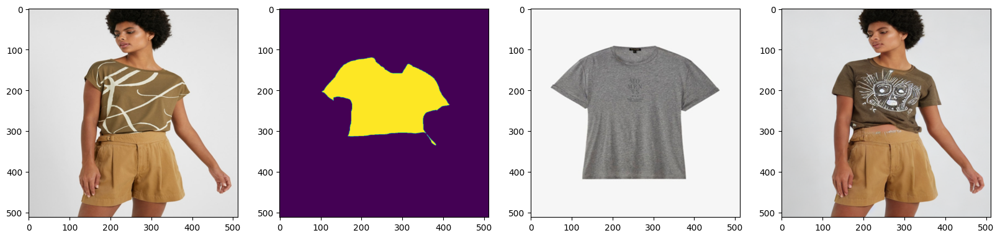

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045


  0%|          | 0/50 [00:00<?, ?it/s]

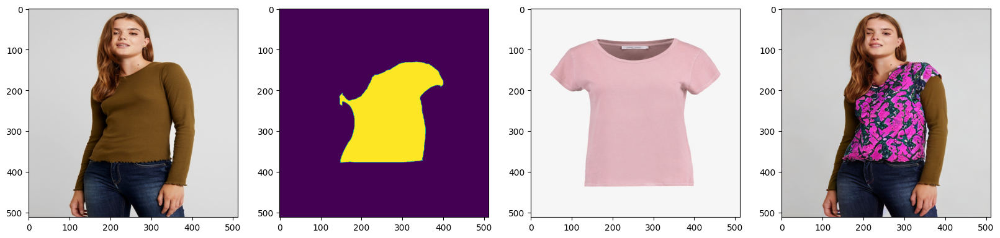

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette


  0%|          | 0/50 [00:00<?, ?it/s]

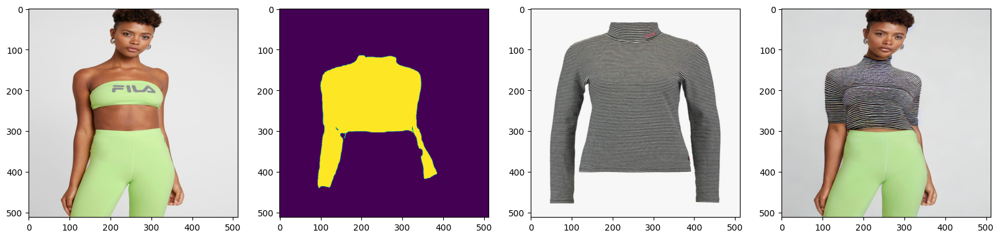

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k


  0%|          | 0/50 [00:00<?, ?it/s]

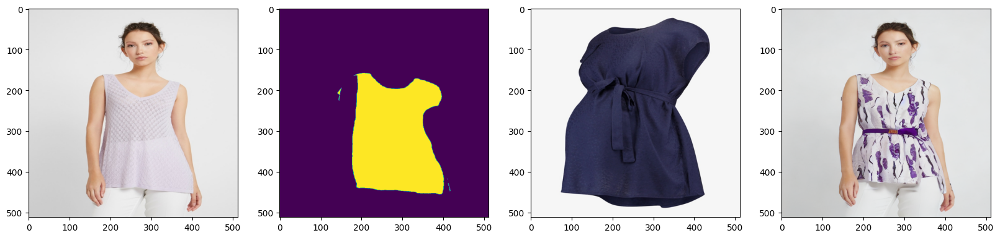

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements


  0%|          | 0/50 [00:00<?, ?it/s]

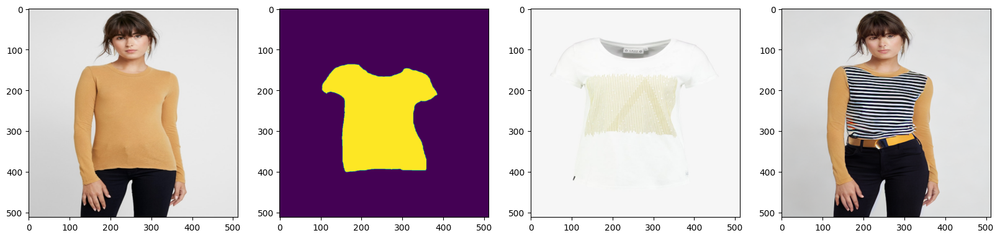

In [7]:
for i in range(5):
    image = Image.open(f"../data/test_cases/image_{i}.png").resize((512, 512))
    mask = Image.open(f"../data/test_cases/warped_cloth_mask_{i}.png").resize((512, 512))
    prompt = cloth_descriptions[i]
    print(prompt)
    res_image = pipe(prompt=prompt, image=image, mask_image=mask).images[0]
    
    fig, ax = plt.subplots(1, 4, figsize=(20, 16))
    ax[0].imshow(image)
    ax[1].imshow(mask)
    ax[2].imshow(Image.open(f"../data/test_cases/cloth_{i}.png").resize((512, 512)))
    ax[3].imshow(res_image)
    plt.show()

## StableDiffusionInpaintPipeline with ControlNet

In [23]:
def ade_palette():
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
                        [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
                        [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
                        [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
                        [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
                        [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
                        [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
                        [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
                        [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
                        [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
                        [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
                        [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
                        [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
                        [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
                        [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
                        [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
                        [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
                        [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
                        [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
                        [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
                        [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
                        [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
                        [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
                        [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
                        [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
                        [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
                        [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
                        [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
                        [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
                        [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
                        [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
                        [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
                        [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
                        [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
                        [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
                        [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
                        [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
                        [102, 255, 0], [92, 0, 255]]

In [137]:
class ControlNetStableDiffusion: 
    
    CONTROLNET_MAPPINGS = {
        "seg": "lllyasviel/sd-controlnet-seg", 
        "canny": "lllyasviel/sd-controlnet-canny", 
        "openpose": "lllyasviel/sd-controlnet-openpose", 
        "depth": "lllyasviel/sd-controlnet-depth", 
        "normal": "lllyasviel/sd-controlnet-normal", 
    }
    
    
    # "stable_diffusion_controlnet_inpaint_img2img"
    # "stable_diffusion_controlnet_inpaint"
    def __init__(self,
                 cn_model: list[str],
                 sd_pipe: str = "stable_diffusion_controlnet_inpaint"
                ) -> None: 
        self.cn_model = cn_model
        self.controlnet = []
        
        if "seg" in cn_model:
            self.image_processor = AutoImageProcessor.from_pretrained(
                "openmmlab/upernet-convnext-small")
            self.image_segmentor = UperNetForSemanticSegmentation.from_pretrained(
                "openmmlab/upernet-convnext-small")
            
            self.controlnet.append(ControlNetModel.from_pretrained(
                ControlNetStableDiffusion.CONTROLNET_MAPPINGS["seg"],
            ))
        elif "openpose" in cn_model:
            from controlnet_aux import OpenposeDetector
            self.openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
            
            self.controlnet.append(ControlNetModel.from_pretrained(
                ControlNetStableDiffusion.CONTROLNET_MAPPINGS["openpose"],
            ))
    
        elif "depth" in cn_model:
            from transformers import pipeline
            self.depth_estimator = pipeline('depth-estimation')
            
            self.controlnet.append(ControlNetModel.from_pretrained(
                ControlNetStableDiffusion.CONTROLNET_MAPPINGS["depth"],
            ))
            
        elif "normal" in cn_model:
            from transformers import pipeline
            self.depth_estimator = pipeline("depth-estimation", model="Intel/dpt-hybrid-midas")
            
            self.controlnet.append(ControlNetModel.from_pretrained(
                ControlNetStableDiffusion.CONTROLNET_MAPPINGS["normal"],
            ))
            
        elif "canny" in cn_model:
            self.controlnet.append(ControlNetModel.from_pretrained(
                ControlNetStableDiffusion.CONTROLNET_MAPPINGS["canny"],
            ))
        else:
            raise NotImplemented
        

        self.pipe = DiffusionPipeline.from_pretrained(
#             "runwayml/stable-diffusion-inpainting",
            '/mnt/vol_c/projects/3d_on_2d/weights/deliberate-inpaint', 
            custom_pipeline=sd_pipe,
            controlnet=self.controlnet[0], 
            safety_checker=None
        )

        self.pipe.scheduler = UniPCMultistepScheduler.from_config(self.pipe.scheduler.config)
        self.pipe.enable_model_cpu_offload()
        
    def image_to_seg(image):
        pixel_values = image_processor(image, return_tensors="pt").pixel_values
        with torch.no_grad():
            outputs = image_segmentor(pixel_values)
        seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
        color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8)  # height, width, 3
        palette = np.array(ade_palette())
        for label, color in enumerate(palette):
            color_seg[seg == label, :] = color
        color_seg = color_seg.astype(np.uint8)
        seg_image = Image.fromarray(color_seg)

        return seg_image
    
    def get_depth(self, image): 
        image = self.depth_estimator(image)['depth']
        image = np.array(image)
        image = image[:, :, None]
        image = np.concatenate([image, image, image], axis=2)
        image = Image.fromarray(image)
        
        return image
    
    def get_normal(self, image):
        image = self.depth_estimator(image)['predicted_depth'][0]
    
        image = image.numpy()
        image_depth = image.copy()
        image_depth -= np.min(image_depth)
        image_depth /= np.max(image_depth)

        bg_threhold = 0.4

        x = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
        x[image_depth < bg_threhold] = 0

        y = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3)
        y[image_depth < bg_threhold] = 0

        z = np.ones_like(x) * np.pi * 2.0

        image = np.stack([x, y, z], axis=2)
        image /= np.sum(image ** 2.0, axis=2, keepdims=True) ** 0.5
        image = (image * 127.5 + 127.5).clip(0, 255).astype(np.uint8)
        image = Image.fromarray(image)
        
        
        image = image.resize((512, 512))
        
        return image
    
    def get_canny(self, image): 
        low_threshold = 100
        high_threshold = 200

        image = cv2.Canny(np.array(image), low_threshold, high_threshold)
        image = image[:, :, None]
        image = np.concatenate([image, image, image], axis=2)
        image = Image.fromarray(image)
        
        return image
    
    def __call__(self, image: PIL.Image, mask_image: PIL.Image, prompt: str):
        # img ad mask image: both (512, 512, 3)
        
        controlnet_conditioning_image = []
        if "seg" in self.cn_model:
            controlnet_conditioning_image.append(image_to_seg(image))
        elif "openpose" in self.cn_model:
            controlnet_conditioning_image.append(self.openpose(image))
        elif "depth" in self.cn_model:
            controlnet_conditioning_image.append(self.get_depth(image))
        elif "normal" in self.cn_model:
            controlnet_conditioning_image.append(self.get_normal(image))
        elif "canny" in self.cn_model:
            controlnet_conditioning_image.append(self.get_canny(image))
        else:
            raise NotImplemented
            
        print(np.array(controlnet_conditioning_image[0]).shape, np.array(image).shape)
        assert np.array(controlnet_conditioning_image[0]).shape == np.array(image).shape
            
        image = self.pipe(prompt,
                    image,
                    mask_image,
                    controlnet_conditioning_image[0],
                    num_inference_steps=20,
        ).images[0]
        
        return image, controlnet_conditioning_image

In [138]:
# sadly, this supports only one controlnet
# "stable_diffusion_controlnet_inpaint_img2img"
# "stable_diffusion_controlnet_inpaint"
cn_pipe = ControlNetStableDiffusion(["openpose"])

a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

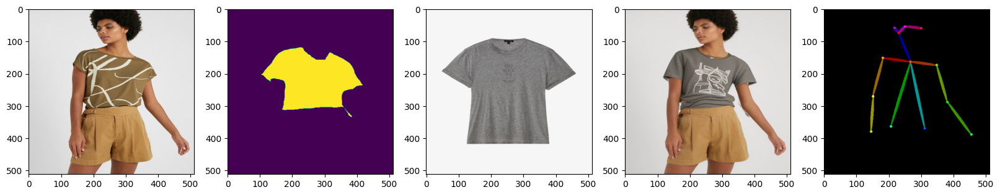

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

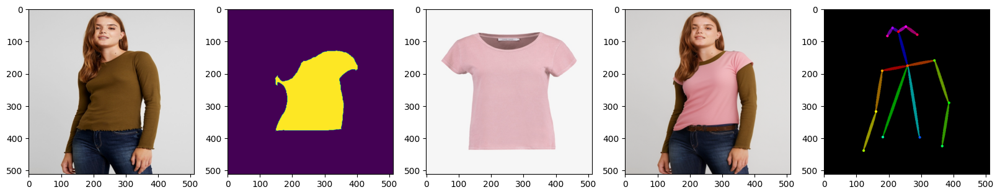

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

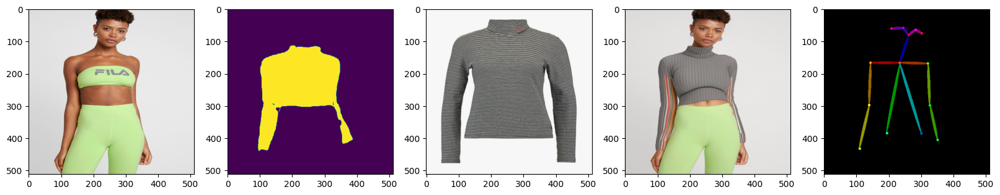

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

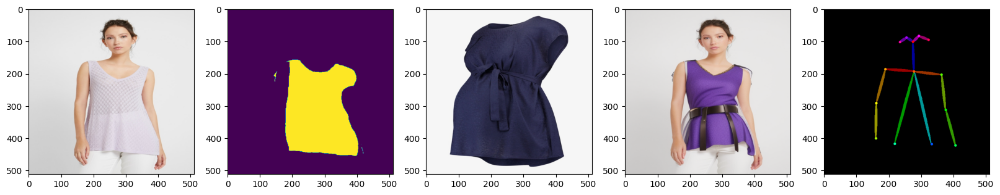

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

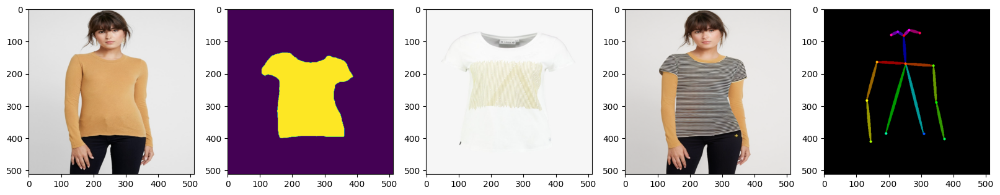

In [139]:
for i in range(5):
    image = Image.open(f"../data/test_cases/image_{i}.png").resize((512, 512))
    mask = Image.open(f"../data/test_cases/warped_cloth_mask_{i}.png").resize((512, 512), Image.NEAREST)
    prompt = cloth_descriptions[i]
    
    print(prompt)
    res_image, cond_image = cn_pipe(image, mask, prompt)
    
    fig, ax = plt.subplots(1, 4 + len(cond_image), figsize=(20, 16))
    ax[0].imshow(image)
    ax[1].imshow(mask)
    ax[2].imshow(Image.open(f"../data/test_cases/cloth_{i}.png").resize((512, 512)))
    ax[3].imshow(res_image)
    for i in range(len(cond_image)):
        ax[4 + i].imshow(cond_image[i])
    plt.show()

In [125]:
## Testing time

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

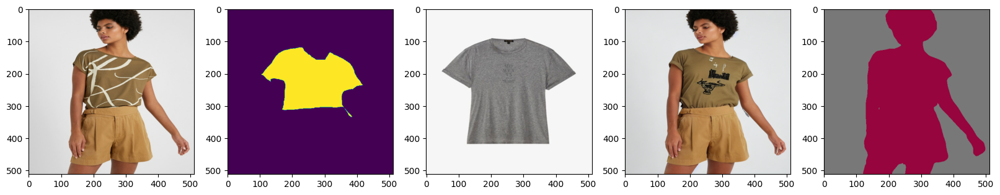

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

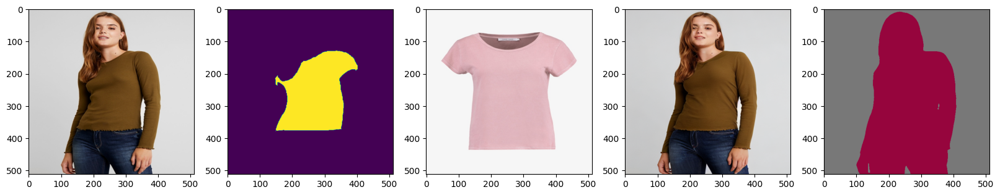

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

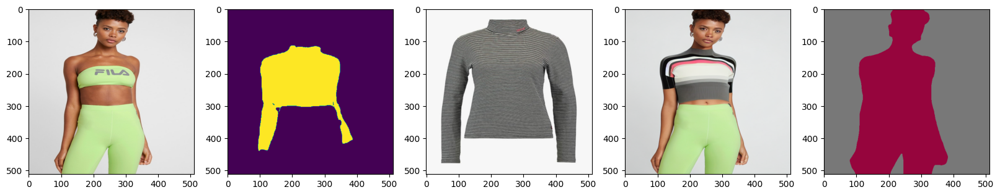

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

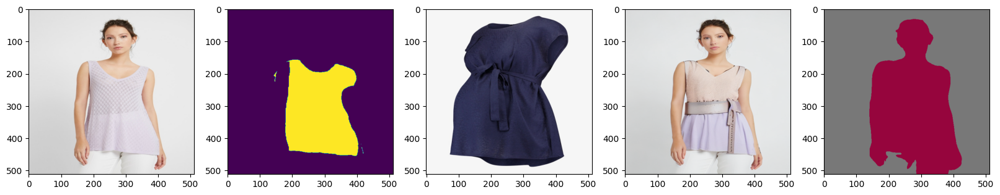

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

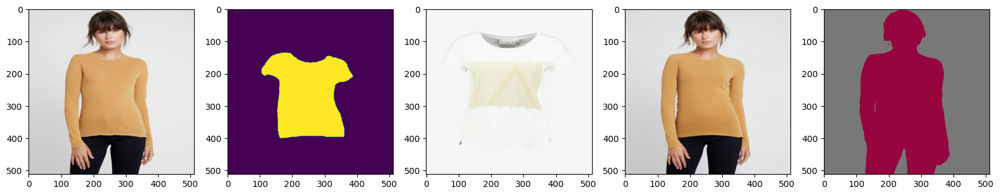

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

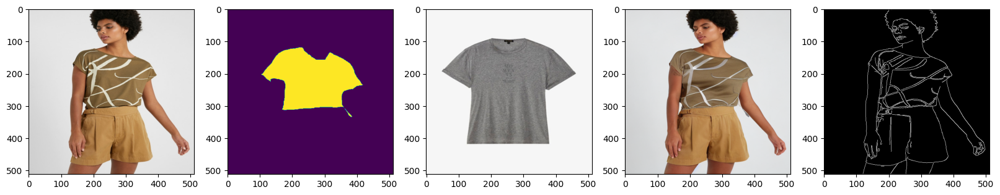

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

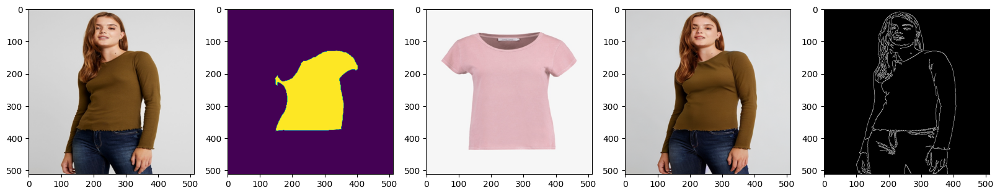

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

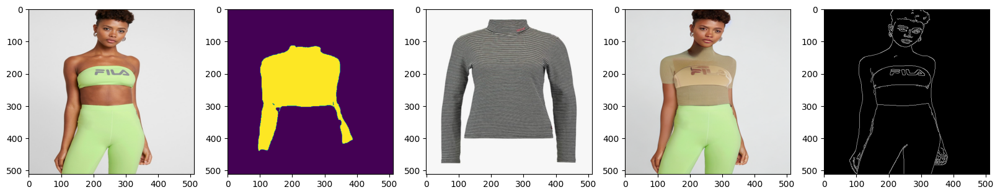

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

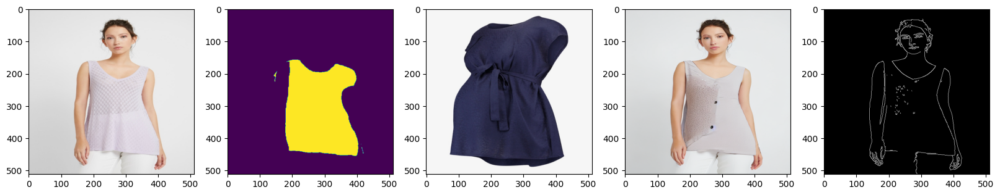

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

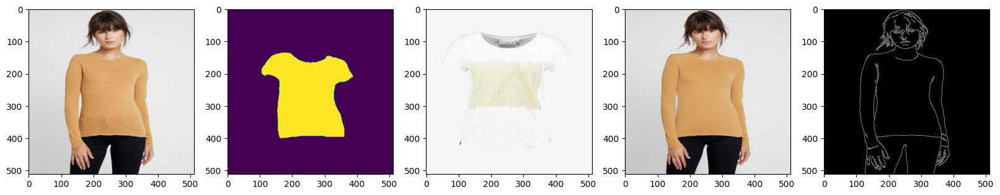

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

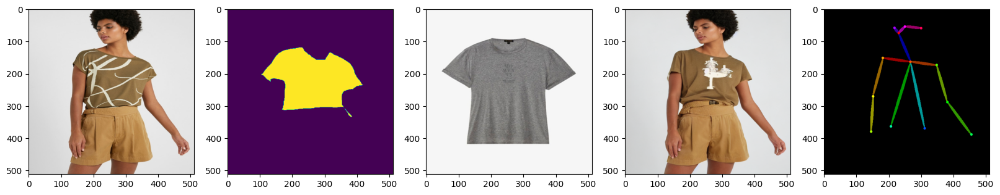

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

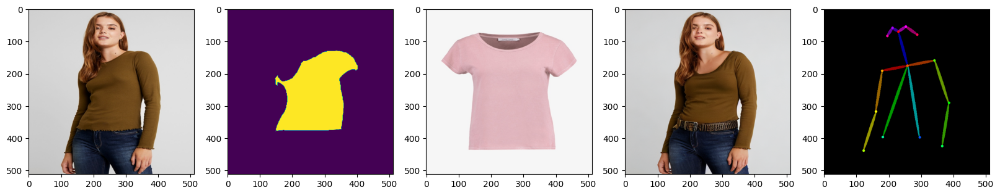

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

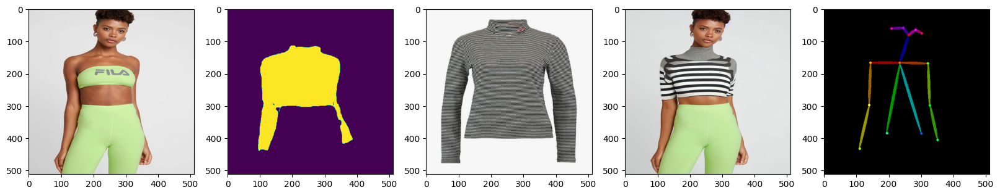

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

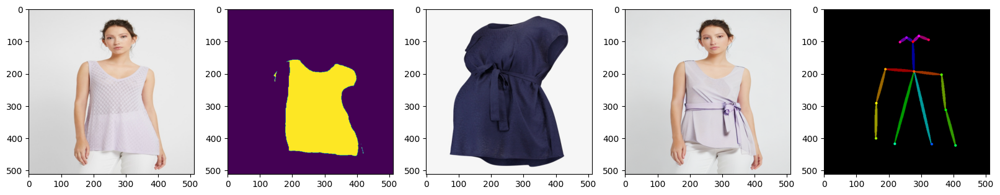

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

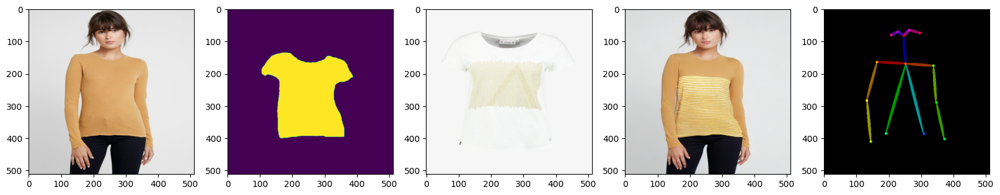

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

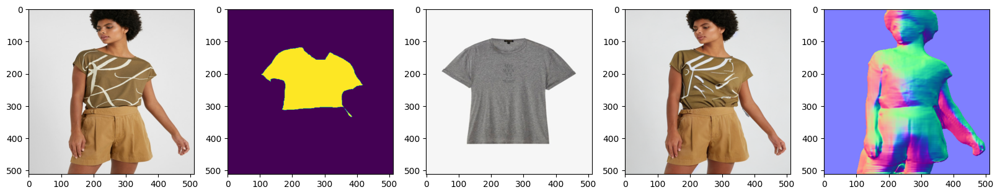

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

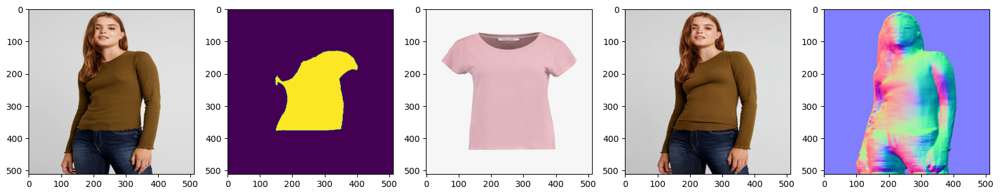

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

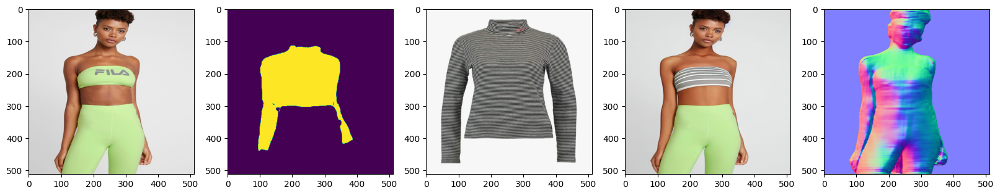

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

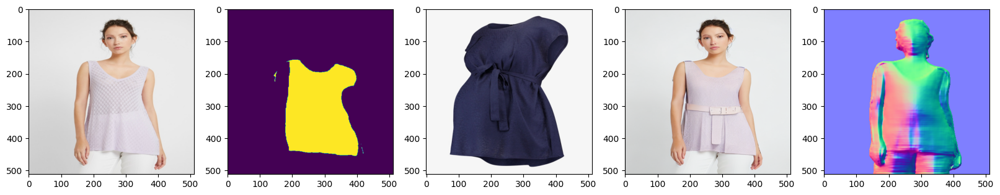

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

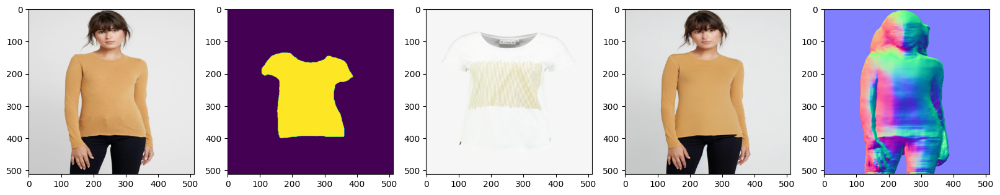

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

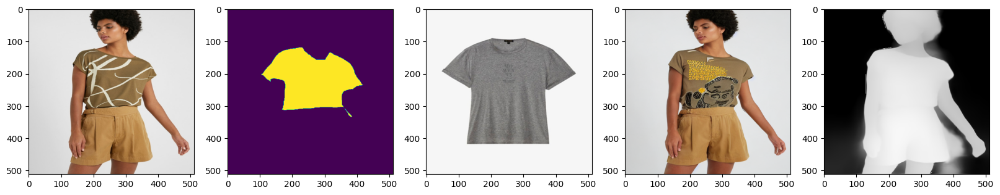

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

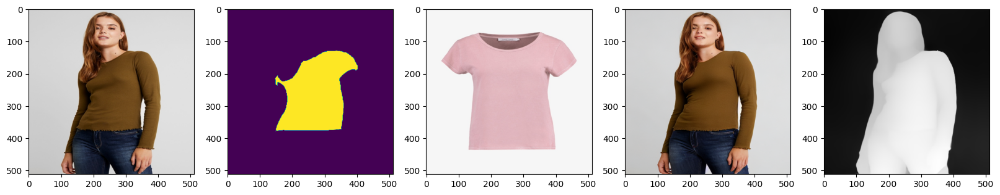

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

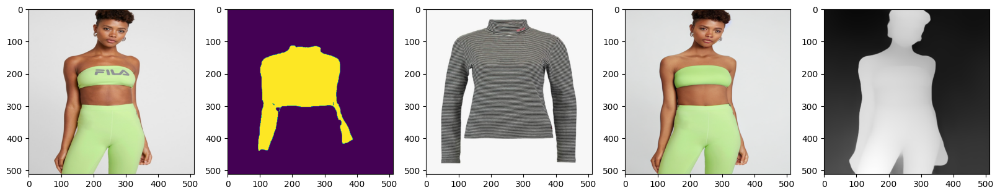

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

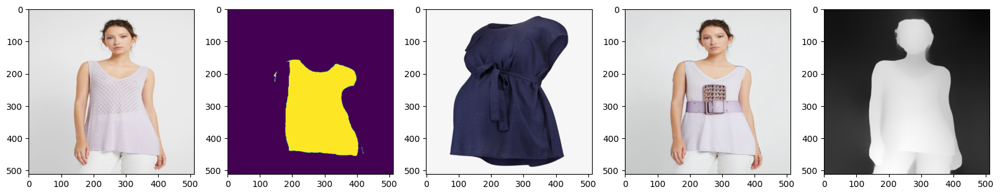

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/16 [00:00<?, ?it/s]

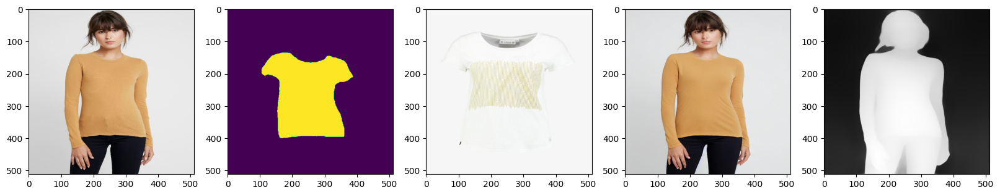

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

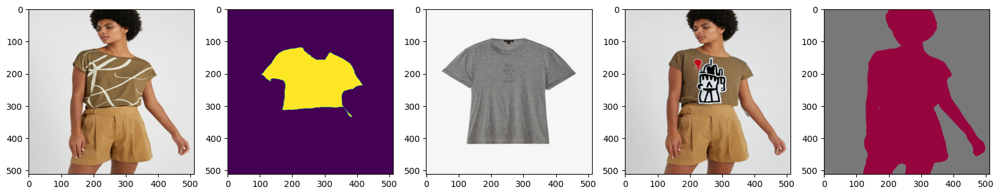

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

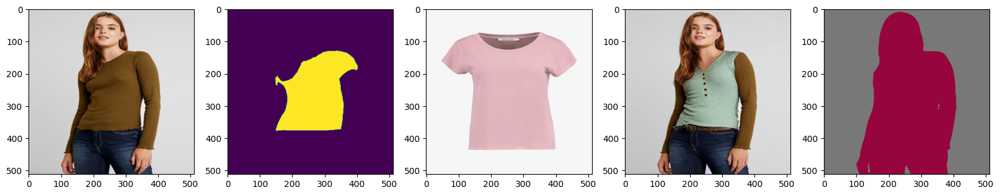

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

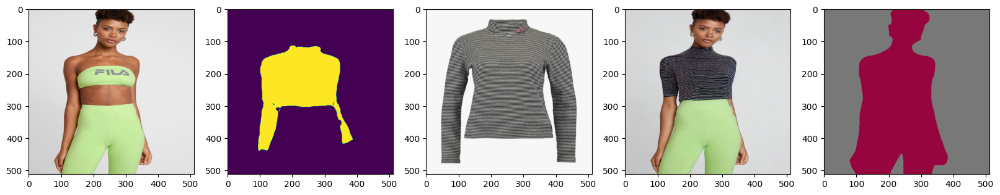

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

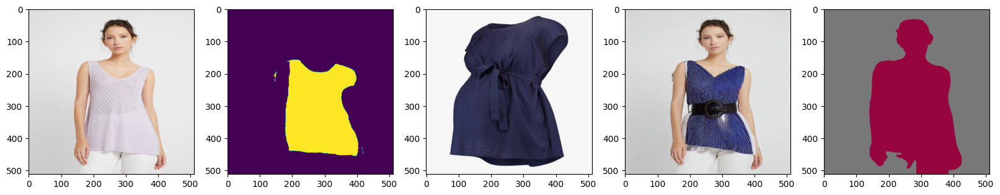

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

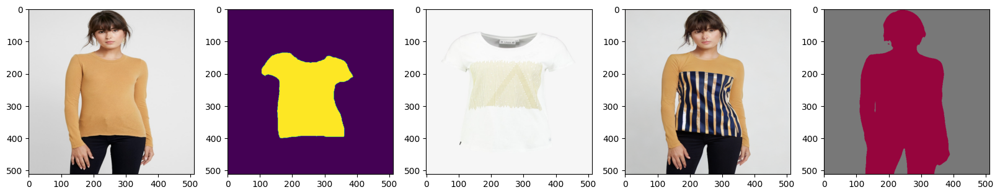

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

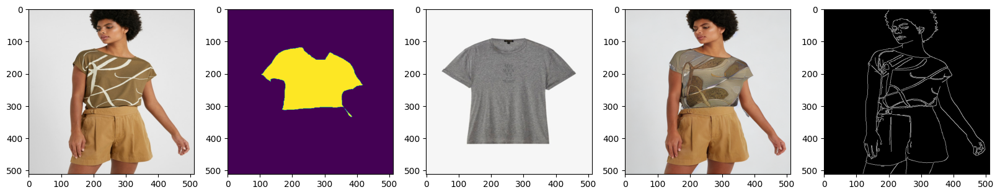

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

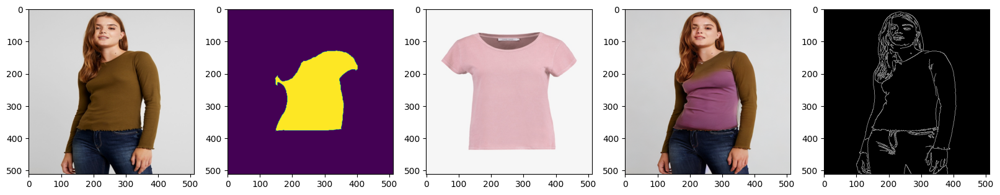

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

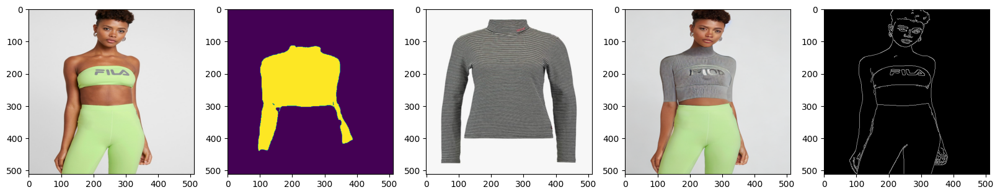

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

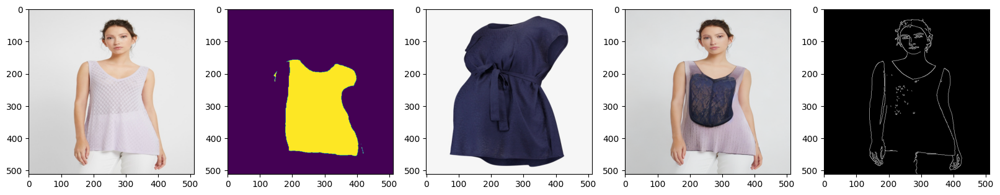

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

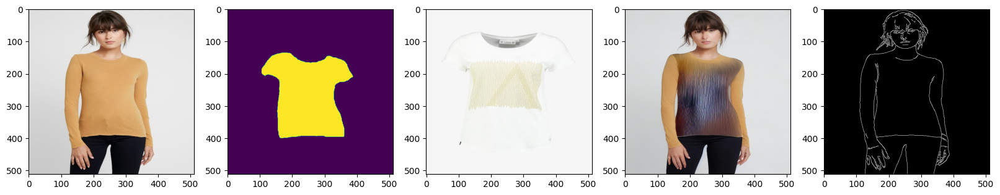

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

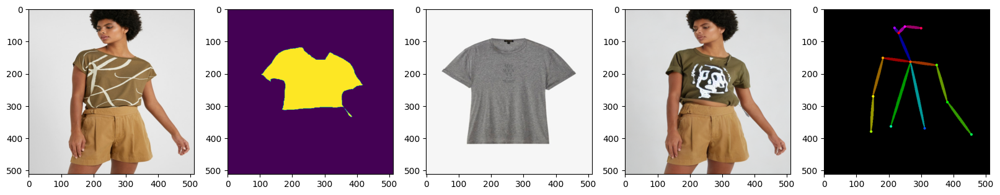

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

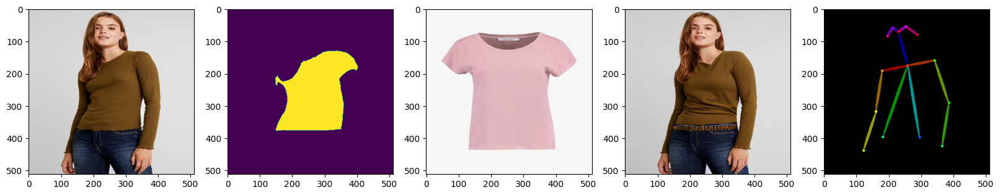

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

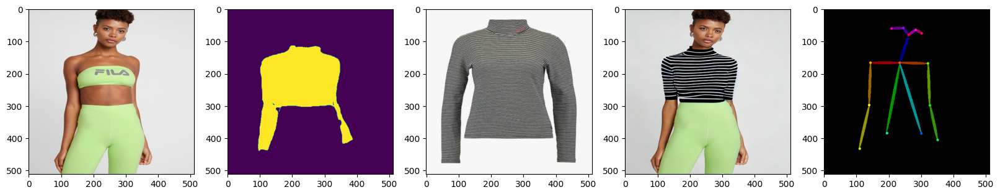

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

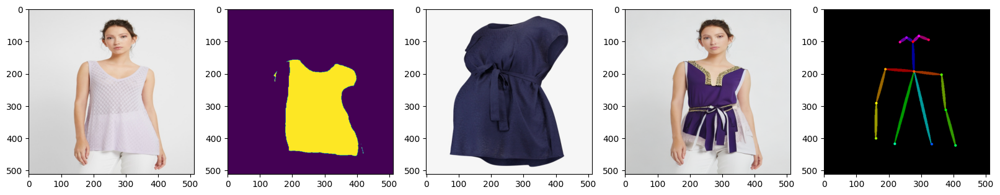

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

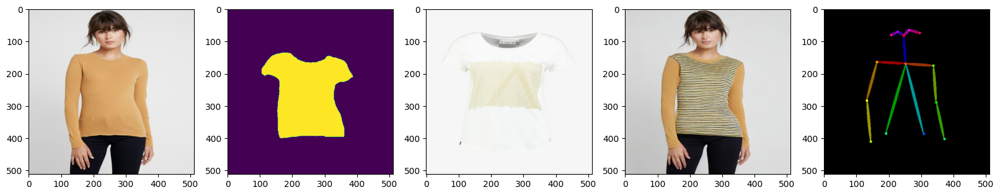

vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

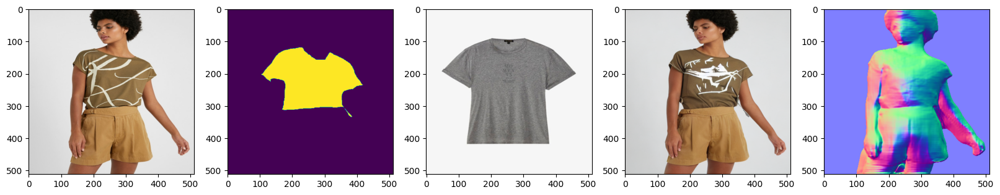

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

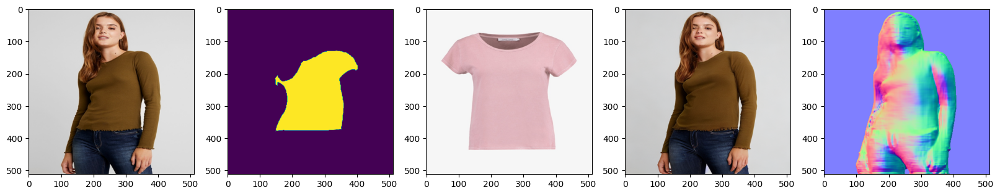

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

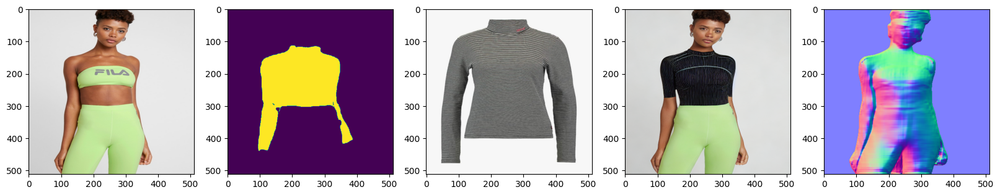

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

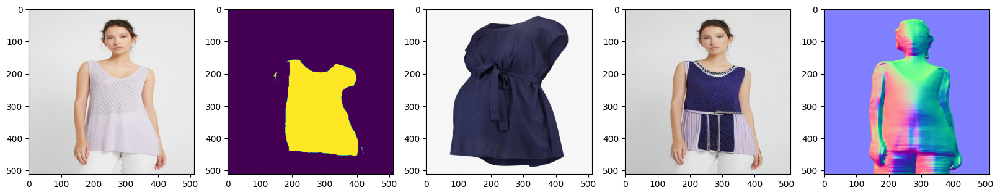

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

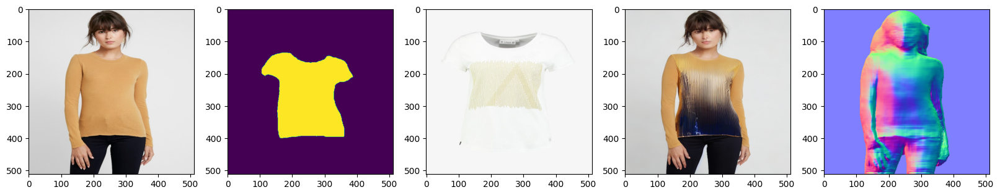

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
vae/diffusion_pytorch_model.safetensors not found


a grey t - shirt with a small embroidered logo on the chest, jean michel basquiat, anja millen, iso640, closed hands, woodland, saguaro, herzog de meuron, bells, tripod, shiny silver, large tall, tudor, 35 mm product photo”, thanshuhai, maintenance, stipple, stand, bentley
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

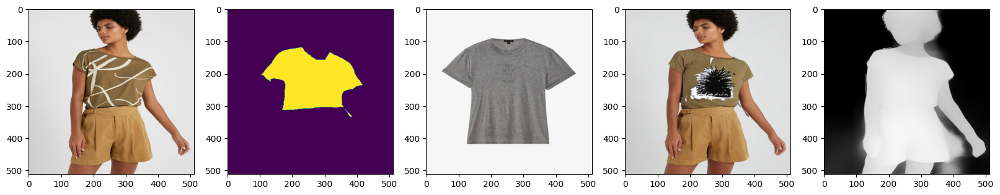

a close up of a pink shirt with a short sleeve, detailed product photo, velvia 100, chalky, basic, munkácsy, 1 5 9 5, online, alpha, abcdefghijklmnopqrstuvwxyz, brigitte, round, 6 4 0, 2045
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

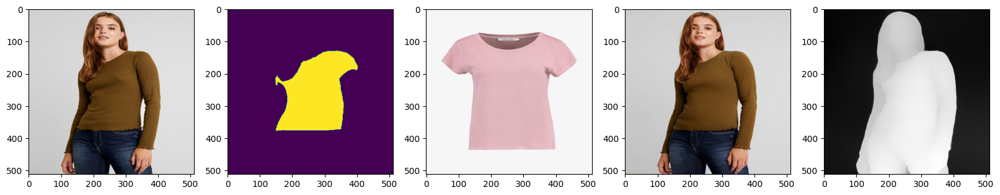

a close up of a woman wearing a striped turtle neck sweater, gif, listing image, sport t-shirt, joop geesink, 33mm photo, frontal picture, basic photo, gray shirt, product image, high definition screenshot, best photo, stacked image, product photo, top - view, short body, black forest, van, bralette
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

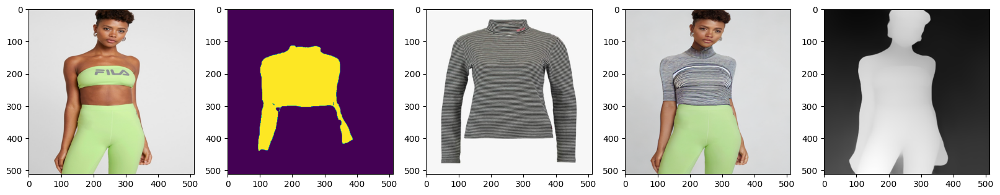

a close up of a woman's top with a belt on it, bump mapped, dark blue, productphoto, beautiful screenshot, siluettes, 4074294527, manila, product photo, violet, gui, zido, listing image, fecund, cape, 0, celebration, mingei, 20k
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

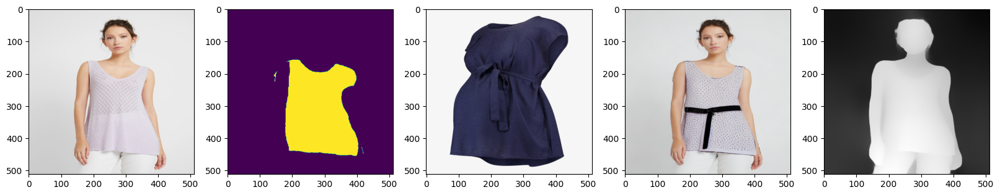

a close up of a white shirt with a yellow stripe, glitter gif, 10k, bench, zdzisław, pearlized, image, lumine, on, alps, stats, abcdefghijklmnopqrstuvwxyz, radiant, information, elements
(512, 512, 3) (512, 512, 3)


  0%|          | 0/20 [00:00<?, ?it/s]

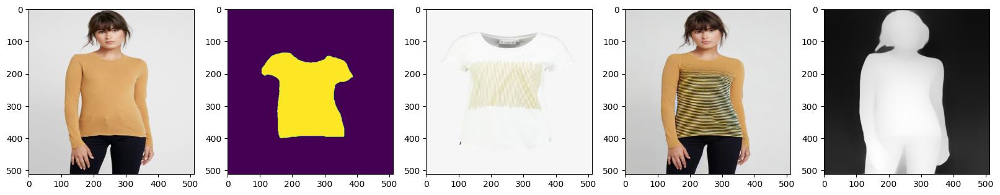

In [133]:
for pipe in ["stable_diffusion_controlnet_inpaint_img2img", "stable_diffusion_controlnet_inpaint"]:
    for cn_model in ["seg", "canny", "openpose", "normal", "depth"]:
        cn_pipe = ControlNetStableDiffusion([cn_model], sd_pipe=pipe)
        
        for i in range(5):
            image = Image.open(f"../data/test_cases/image_{i}.png").resize((512, 512))
            mask = Image.open(f"../data/test_cases/warped_cloth_mask_{i}.png").resize((512, 512), Image.NEAREST)
            prompt = cloth_descriptions[i]

            print(prompt)
            res_image, cond_image = cn_pipe(image, mask, prompt)

            fig, ax = plt.subplots(1, 4 + len(cond_image), figsize=(20, 16))
            ax[0].imshow(image)
            ax[1].imshow(mask)
            ax[2].imshow(Image.open(f"../data/test_cases/cloth_{i}.png").resize((512, 512)))
            ax[3].imshow(res_image)
            for i in range(len(cond_image)):
                ax[4 + i].imshow(cond_image[i])
            plt.show()